# Project Proposal for Lobbysts4America: Analyzing Congressional Tweets (2008-2017) for Lobbying Insights

## Data set source:
[US_PoliticalTweets](https://www.dropbox.com/sh/qrq1pcjsji0v03u/AAC639WcH58tM0YZperwY388a?dl=0) (Congressional Tweets Dataset -- 2008-2017 data)

[SQL Basics for Data Science Specialization](https://www.coursera.org/specializations/learn-sql-basics-data-science)

## Description:

This project is part of the SQL for Data Science Specialization capstone project that aims to analyze congressional tweets from 2008 to 2017 to gain insights into key topics, influential members, and relationships within Congress. The findings will be of interest to Lobbyists4America, a company seeking to strengthen their lobbying efforts by understanding legislative trends and member engagement on Twitter. The audience for this project includes lobbyists, policymakers, and individuals interested in understanding the dynamics of congressional discussions on social media.



## Questions:

1. What are the most discussed topics in congressional tweets during the specified period?
2. Which members of Congress are the most active on Twitter and engage with legislative topics?
3. Are there any significant connections or relationships between members based on their interactions on Twitter?

## Hypotheses:

1. Congressional tweets will cover a wide range of topics, including healthcare, economy, defense, and immigration.
2. Influential members of Congress, committee chairs, and leaders are expected to be more active on Twitter and have higher engagement with tweets related to legislation.
3. Social network analysis might reveal clusters of members who frequently interact or retweet each other, indicating potential alliances or affiliations.

## Approach:
The initial approach involves data collection, importation, and cleaning. We will then perform initial exploration to understand data distributions and patterns. Key features to be analyzed include tweet text, timestamp, user mentions, and retweet counts. We will apply natural language processing techniques to extract topics from the tweet text and identify frequent co-occurrences among members.

For the analysis, we will conduct social network analysis to uncover relationships and connections between members based on retweets. Additionally, sentiment analysis will be used to gauge the tone of congressional tweets over time. The primary evaluation metric will be the identification of significant topics, highly engaged members, and clusters of interconnected members.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# Import files
tweets_data = pd.read_json("tweets.json", lines=True)
users_data = pd.read_json("users.json", lines = True)

In [3]:
pd.set_option('display.max_colwidth', None)
tweets_data.head()

,contributors,coordinates,created_at,display_text_range,entities,favorite_count,favorited,geo,id,id_str,...,text,truncated,user_id,possibly_sensitive,extended_entities,quoted_status_id,quoted_status_id_str,withheld_copyright,withheld_in_countries,withheld_scope
0,NaN,None,2008-08-04 17:28:51,"[0, 74]","{'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []}",0,False,None,877418565,877418565,...,On a conference call about a weekend trip to Iraq to visit Arkansas troops,False,5558312,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,None,2008-08-06 19:04:45,"[0, 25]","{'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []}",0,False,None,879618172,879618172,...,Being interviewed by KTHV,False,5558312,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,None,2008-08-06 20:35:36,"[0, 65]","{'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []}",0,False,None,879695803,879695803,...,Being interviewed by KARN on his Arkansas World Trade Center trip,False,5558312,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,None,2008-08-07 13:52:52,"[0, 37]","{'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []}",0,False,None,880393665,880393665,...,"On KWHN in Fort Smith, that's 1320 AM",False,5558312,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,None,2008-08-07 15:12:05,"[0, 90]","{'hashtags': [], 'symbols': [], 'urls': [], 'user_mentions': []}",0,False,None,880474266,880474266,...,Attending a Military of the Purple Heart Ceremony at the VA Medical Center in Fayetteville,False,5558312,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
users_data.head()

,contributors_enabled,created_at,default_profile,default_profile_image,description,entities,favourites_count,follow_request_sent,followers_count,following,...,profile_text_color,profile_use_background_image,protected,screen_name,statuses_count,time_zone,translator_type,url,utc_offset,verified
0,False,1970-01-01 00:00:01.417384037+00:00,True,False,"Official Twitter page of Alaska Governor Bill Walker; honored to serve AK w/ @LtGovMallott. RTs ≠ endorsements.Tweets signed ""-BW"" come directly from Governor.","{'description': {'urls': []}, 'url': {'urls': [{'display_url': 'gov.alaska.gov', 'expanded_url': 'http://gov.alaska.gov', 'indices': [0, 22], 'url': 'http://t.co/NO67LyZvUR'}]}}",115,False,5870,False,...,333333,True,False,AkGovBillWalker,1642,None,none,http://t.co/NO67LyZvUR,NaN,True
1,False,1970-01-01 00:00:01.240239576+00:00,False,False,"U.S. Senator from Minnesota. Follows, Retweets, Replies ≠ endorsement","{'description': {'urls': []}, 'url': {'urls': [{'display_url': 'amyklobuchar.com', 'expanded_url': 'http://www.amyklobuchar.com', 'indices': [0, 22], 'url': 'http://t.co/mGGFBfggto'}]}}",24,False,170717,False,...,3D3C3D,True,False,amyklobuchar,5567,Central Time (US & Canada),none,http://t.co/mGGFBfggto,-18000.0,True
2,False,1970-01-01 00:00:01.366837593+00:00,False,False,"Congressman for Maryland's 4th Congressional District, former Army Aviator, father and husband","{'description': {'urls': []}, 'url': {'urls': [{'display_url': 'anthonybrown.com', 'expanded_url': 'http://www.anthonybrown.com', 'indices': [0, 23], 'url': 'https://t.co/NYPWOVmoAx'}]}}",90,False,6067,False,...,333333,False,False,AnthonyBrownMD4,1878,Eastern Time (US & Canada),none,https://t.co/NYPWOVmoAx,-14400.0,True
3,False,1970-01-01 00:00:01.300739574+00:00,False,False,"Husband of 43 yrs, Dad of 4, Papaw of 6. Lifelong Arkansan. Governor of Arkansas. Former Congressman, Admin. of DEA, Under Sec. of Homeland Security.","{'description': {'urls': []}, 'url': {'urls': [{'display_url': 'governor.arkansas.gov', 'expanded_url': 'http://www.governor.arkansas.gov', 'indices': [0, 23], 'url': 'https://t.co/b38CUNlZHi'}]}}",440,False,25747,False,...,333333,False,False,AsaHutchinson,3778,Central Time (US & Canada),none,https://t.co/b38CUNlZHi,-18000.0,True
4,False,1970-01-01 00:00:01.294329706+00:00,False,False,I am proud to represent the 8th Congressional District of Georgia.,"{'description': {'urls': []}, 'url': {'urls': [{'display_url': 'austinscott.house.gov', 'expanded_url': 'http://austinscott.house.gov', 'indices': [0, 22], 'url': 'http://t.co/GQwXIhub9a'}]}}",12,False,13048,False,...,11172E,True,False,AustinScottGA08,2022,None,none,http://t.co/GQwXIhub9a,NaN,True


In [5]:
tweets_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1243370 entries, 0 to 1243369
Data columns (total 32 columns):
 #   Column                     Non-Null Count    Dtype         
---  ------                     --------------    -----         
 0   contributors               0 non-null        float64       
 1   coordinates                2734 non-null     object        
 2   created_at                 1243370 non-null  datetime64[ns]
 3   display_text_range         1243370 non-null  object        
 4   entities                   1243370 non-null  object        
 5   favorite_count             1243370 non-null  int64         
 6   favorited                  1243370 non-null  bool          
 7   geo                        2734 non-null     object        
 8   id                         1243370 non-null  int64         
 9   id_str                     1243370 non-null  int64         
 10  in_reply_to_screen_name    65411 non-null    object        
 11  in_reply_to_status_id      54146 non-

In [6]:
users_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 548 entries, 0 to 547
Data columns (total 42 columns):
 #   Column                              Non-Null Count  Dtype              
---  ------                              --------------  -----              
 0   contributors_enabled                548 non-null    bool               
 1   created_at                          548 non-null    datetime64[ns, UTC]
 2   default_profile                     548 non-null    bool               
 3   default_profile_image               548 non-null    bool               
 4   description                         548 non-null    object             
 5   entities                            545 non-null    object             
 6   favourites_count                    548 non-null    int64              
 7   follow_request_sent                 548 non-null    bool               
 8   followers_count                     548 non-null    int64              
 9   following                           548 non

### Select only relevant columns to work with

In [7]:
tweets_df = tweets_data[['id', 'created_at', 'favorite_count', 'retweet_count', 'screen_name','text', 'user_id', 'entities']]
users_df = users_data[['id', 'created_at', 'description', 'favourites_count', 'followers_count', 'friends_count', 'listed_count' ,'name', 'screen_name', 'statuses_count', 'location']]

In [8]:
# Check for any duplicates users
users_df['id'].nunique()

548

#### Perform Exploratory Data Analysis

In [9]:
pd.set_option('display.float_format', lambda x: '%.3f' % x)
users_df.describe()

,id,favourites_count,followers_count,friends_count,listed_count,statuses_count
count,548.000,548.000,548.000,548.000,548.000,548.000
mean,72363033893011936.000,413.912,163433.909,2033.732,1340.648,3658.960
std,231221286494740288.000,965.151,1597357.021,6278.436,3567.588,4259.273
min,5558312.000,0.000,4.000,0.000,0.000,0.000
25%,57688816.000,32.750,8960.250,368.000,426.750,1387.500
50%,247051870.500,120.500,16732.000,751.500,750.000,2684.000
75%,1212627050.250,379.750,33081.000,1670.500,1257.000,4509.250
max,854715071116849152.000,12507.000,31712585.000,92934.000,70660.000,59535.000


In [10]:
print("Min created user:", users_df['created_at'].min())
print("Max created user:", users_df['created_at'].max())

Min created user: 1970-01-01 00:00:01.177689952+00:00
Max created user: 2016-10-23 18:23:37+00:00


<Axes: >

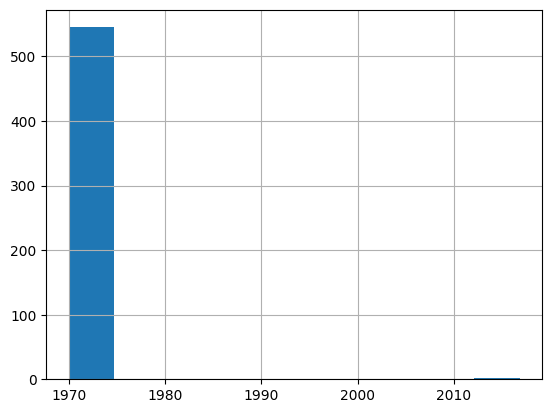

In [11]:
# Seems it looks weird that the oldest account created is 1970
users_df['created_at'].hist()

The **created_at** column wont be neccessary for our analysis but it is important to point out that the majority of users appears
to be created in 1970 which looks like an bug from twitter API side.

In [12]:
users_df = users_df.drop(columns=['created_at'])

In [13]:
tweets_df.describe()

,id,created_at,favorite_count,retweet_count,user_id
count,1243370.000,1243370,1243370.000,1243370.000,1243370.000
mean,609659588380898944.000,2015-06-08 21:36:57.326325248,200.852,190.063,13974047938548068.000
min,877418565.000,2008-08-04 17:28:51,0.000,0.000,5558312.000
25%,476795186032589824.000,2014-06-11 18:36:45,0.000,1.000,33750798.000
50%,662381754246868992.000,2015-11-05 21:31:31,2.000,4.000,234022257.000
75%,781241570795330560.000,2016-09-28 21:17:59.750000128,8.000,10.000,993153006.000
max,872140026737336320.000,2017-06-06 17:16:00,984832.000,3637896.000,854715071116849152.000
std,214092515324098304.000,NaN,3545.405,9944.392,105338269101701552.000


In [14]:
# Check min, max and distribution of tweets using the created at column
print("Min created tweet:", tweets_df['created_at'].min())
print("Max created tweet:", tweets_df['created_at'].max())

Min created tweet: 2008-08-04 17:28:51
Max created tweet: 2017-06-06 17:16:00


<Axes: >

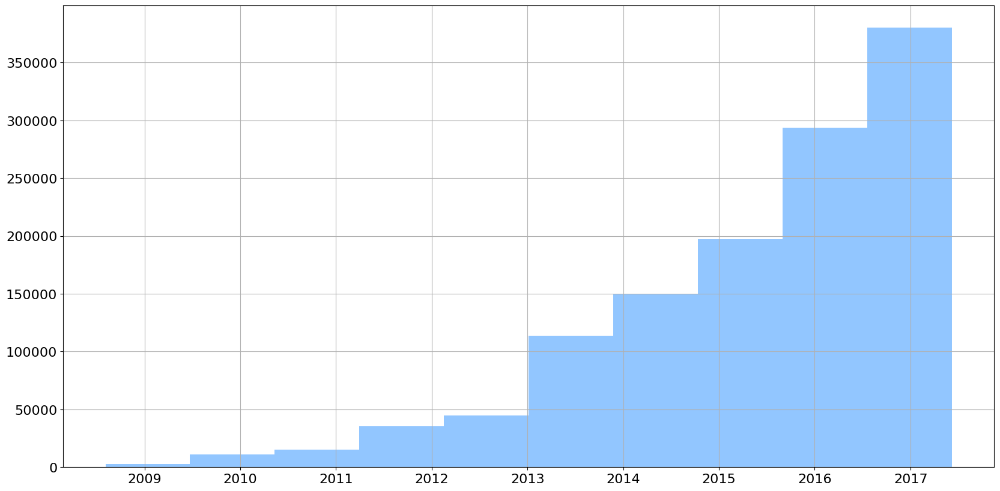

In [66]:
# Set up global parameters
import matplotlib
matplotlib.rcParams['figure.figsize'] = (20, 10)  # Set default figure size (width, height)
matplotlib.rcParams['font.size'] = 16          # Set default font size
matplotlib.rcParams['axes.titlesize'] = 30     # Set default title font size
matplotlib.rcParams['axes.labelsize'] = 20     # Set default label font size
plt.style.use('seaborn-v0_8-pastel')

tweets_df.created_at.hist()

In [20]:
# Rename id column to a descriptive name
users_df = users_df.rename(columns={"id": "user_id"})
# Check again for columns names and types
users_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 548 entries, 0 to 547
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   user_id           548 non-null    int64 
 1   description       548 non-null    object
 2   favourites_count  548 non-null    int64 
 3   followers_count   548 non-null    int64 
 4   friends_count     548 non-null    int64 
 5   listed_count      548 non-null    int64 
 6   name              548 non-null    object
 7   screen_name       548 non-null    object
 8   statuses_count    548 non-null    int64 
 9   location          548 non-null    object
dtypes: int64(6), object(4)
memory usage: 42.9+ KB


In [21]:
tweets_df = tweets_df.rename(columns={"id": "tweet_id"})
# Check again for columns names and types
tweets_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1243370 entries, 0 to 1243369
Data columns (total 8 columns):
 #   Column          Non-Null Count    Dtype         
---  ------          --------------    -----         
 0   tweet_id        1243370 non-null  int64         
 1   created_at      1243370 non-null  datetime64[ns]
 2   favorite_count  1243370 non-null  int64         
 3   retweet_count   1243370 non-null  int64         
 4   screen_name     1243370 non-null  object        
 5   text            1243370 non-null  object        
 6   user_id         1243370 non-null  int64         
 7   entities        1243370 non-null  object        
dtypes: datetime64[ns](1), int64(4), object(3)
memory usage: 75.9+ MB


#### Database Integration for Enhanced Data Management

Incorporating the tweets.json file, which contains an extensive collection of over a million records, into a database environment offers significant advantages in terms of data retrieval and storage efficiency. Given the substantial volume and size of the file, it becomes essential to organize the tweets into structured tables within a SQLite database. This approach not only facilitates optimized data management but also ensures streamlined access to valuable information.

![twitter database](tweets_db_erd.png)


In [25]:
import sqlite3

# Connect to the SQLite database (or create one if it doesn't exist)
conn = sqlite3.connect('twitter_data.db')
cursor = conn.cursor()

In [26]:
# Create the Users table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS Users (
        user_id          INTEGER PRIMARY KEY,
        name             TEXT,
        screen_name      TEXT,
        favourites_count INTEGER,
        followers_count  INTEGER,
        statuses_count   INTEGER,
        friends_count    INTEGER,
        listed_count     INTEGER,
        location         TEXT,
        description      TEXT
    )
''')


# Create the tweets table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS Tweets (
        tweet_id           INTEGER PRIMARY KEY,
        created_at         TEXT,
        favorite_count     INTEGER,
        retweet_count      INTEGER,
        text               TEXT,
        user_id            INTEGER,
        FOREIGN KEY (user_id) REFERENCES Users (user_id)
    )
''')

# Create the Hashtags table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS Hashtags (
        hashtag_id  INTEGER PRIMARY KEY,
        text        TEXT,
        count       INTEGER
    )
''')

# Create the TweetHashtags junction table
cursor.execute('''
    CREATE TABLE IF NOT EXISTS TweetHashtags (
        tweet_id   INTEGER,
        hashtag_id INTEGER,
        PRIMARY KEY (tweet_id, hashtag_id),
        FOREIGN KEY (tweet_id)   REFERENCES Tweets (tweet_id),
        FOREIGN KEY (hashtag_id) REFERENCES Hastags (hashtag_id)
    )
''')



# Create the TweetUserMention table (junction table)
cursor.execute('''
    CREATE TABLE IF NOT EXISTS TweetUserMention (
        tweet_id INTEGER,
        user_id INTEGER,
        name    TEXT,
        screen_name TEXT,
        PRIMARY KEY (tweet_id, user_id),
        FOREIGN KEY (tweet_id) REFERENCES Tweets (tweet_id),
        FOREIGN KEY (user_id) REFERENCES Users (user_id)
    )
''')

# Commit changes and close the connection
conn.commit()

In [27]:
# Insert user_df to database
users_df.to_sql('Users', conn, if_exists='append', index=False)

548

In [28]:
# Populate Tweets table
col_names = ['tweet_id', 'created_at', 'favorite_count', 'retweet_count', 'text', 'user_id']
tweets_df[col_names].to_sql('Tweets', conn, if_exists='append', index=False)

1243370

In [29]:
# Extract hashtags from tweets_df entities and count the number of occurrences
hashtags = {}

for i in range(len(tweets_df['entities'])):
    if len(tweets_df['entities'][i]['hashtags']) > 0:
        for j in range(len(tweets_df['entities'][i]['hashtags'])):
            # hashtags.append(tweets_df['entities'][i]['hashtags'][j]['text'])
            text = tweets_df['entities'][i]['hashtags'][j]['text']
            hashtags[text] = hashtags.get(text, 0) + 1
        

In [30]:
# Populate Hashtags table
for key, value in hashtags.items():
    cursor.execute('INSERT INTO Hashtags (text, count) VALUES (?, ?)', (key, value))

conn.commit()

In [31]:
# Extract hashtags from tweets_df entities and tweet_id
hashtags_and_tweets_id = []

for i in range(len(tweets_df['entities'])):
    if len(tweets_df['entities'][i]['hashtags']) > 0:
        for j in range(len(tweets_df['entities'][i]['hashtags'])):
            tweet_id = int(tweets_df['tweet_id'][i])
            text = tweets_df['entities'][i]['hashtags'][j]['text']
            hashtags_and_tweets_id.append([tweet_id, text])

In [32]:
# Populate TweetHashtags table
hashtags_and_tweets_id_df = pd.DataFrame(hashtags_and_tweets_id, columns = ['tweet_id', 'text'])
hashtags_df = pd.read_sql_query('SELECT hashtag_id, text FROM Hashtags', conn)
merged_df = hashtags_and_tweets_id_df.merge(hashtags_df, on='text', how='left')
merged_df[['tweet_id', 'hashtag_id']].to_sql("TweetHashtags",conn, if_exists='replace', index=False)

906530

In [33]:
# Populale TweetUserMention table
for i in range(len(tweets_df['entities'])):
    if len(tweets_df['entities'][i]['user_mentions']) > 0:
        for j in range(len(tweets_df['entities'][i]['user_mentions'])):
            tweet_id = int(tweets_df['tweet_id'][i])  # Convert tweet_id to integer
            user_id = tweets_df['entities'][i]['user_mentions'][j]['id']
            name = tweets_df['entities'][i]['user_mentions'][j]['name']
            screen_name = tweets_df['entities'][i]['user_mentions'][j]['screen_name']
            cursor.execute("""
                INSERT OR IGNORE INTO TweetUserMention (tweet_id, user_id, name, screen_name) VALUES (?, ?, ? , ?)""",
                           (tweet_id, user_id, name, screen_name)
                          )
conn.commit()

#### Visualizations


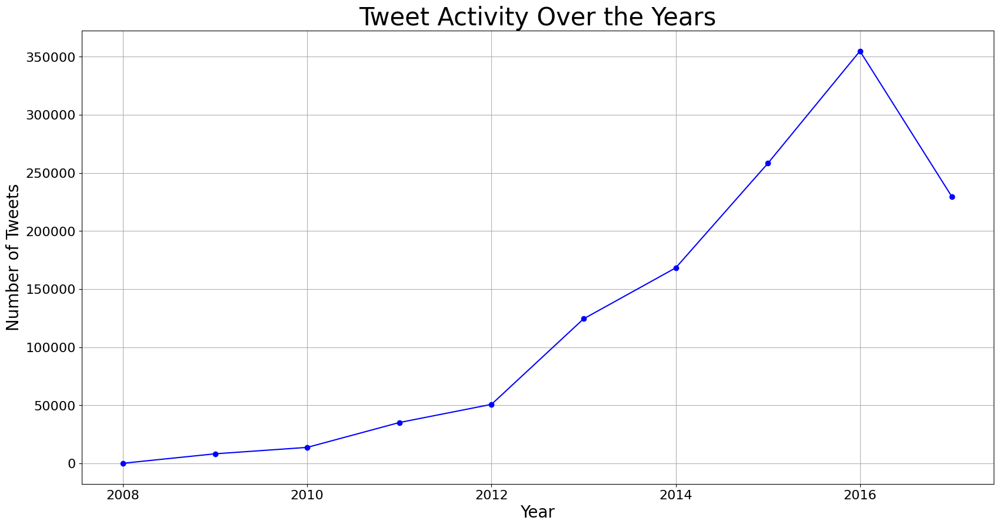

In [67]:
# Retrieve tweet activity from database
tweet_activity = pd.read_sql_query("SELECT created_at FROM Tweets", conn)
tweet_activity['created_at'] = pd.to_datetime(tweet_activity['created_at'])
tweet_activity = tweet_activity.groupby(tweet_activity['created_at'].dt.year).size()

title = "Tweet Activity Over the Years"
plt.figure(figsize=(20, 10))
plt.plot(tweet_activity.index, tweet_activity.values, marker='o', linestyle='-', color='b')
plt.xlabel('Year')
plt.ylabel('Number of Tweets')
plt.title(title, color='black')
plt.grid(True)

# Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()


### What are the most discussed topics in congressional tweets during the specified period?

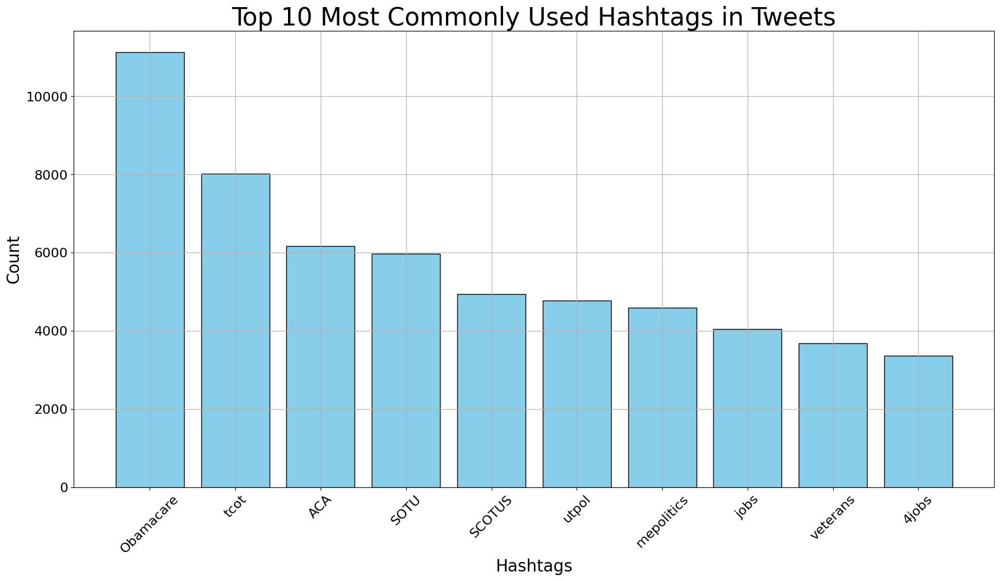

In [68]:
# Retrieve all hashtags and counts
hashtags_df = pd.read_sql_query("SELECT text, count FROM Hashtags ORDER BY count DESC", conn)
top_10_hashtags = hashtags_df.nlargest(10, 'count')

title = "Top 10 Most Commonly Used Hashtags in Tweets"

plt.figure(figsize=(20, 10))
plt.bar(top_10_hashtags['text'], top_10_hashtags['count'],color='skyblue', edgecolor='black')
plt.xlabel('Hashtags')
plt.ylabel('Count')
plt.title(title, color='black')
plt.xticks(rotation=45)
plt.grid(True)

# Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

#### Hypotheses:

Congressional tweets will cover a wide range of topics, including healthcare, economy, defense, and immigration.

1. **Obamacare** (Affordable Care Act) - Healthcare
2. **tcot** (Top Conservatives on Twitter) - General conservative topics
3. **ACA** (Affordable Care Act) - Healthcare
4. **SOTU** (State of the Union) - Politics and Government
5. **SCOTUS** (Supreme Court of the United States) - Law and Judiciary
6. **utpol** (Utah Politics) - Local politics
7. **mepolitics** (Maine Politics) - Local politics
8. **jobs** - Economy and Employment
9. **veterans** - Military and Veterans Affairs
10. **4jobs** (For Jobs) - Economy and Employment

As we can see, the hashtags cover various topics such as healthcare, economy, defense, politics, law, and local politics. This supports the initial hypothesis that congressional tweets indeed cover a wide range of topics, including healthcare, economy, defense, and immigration. The presence of hashtags related to specific policy topics and political events also indicates that congressional discussions on Twitter encompass diverse subjects and are not limited to a particular theme.

In [41]:
# Let's explore who uses the top 10 most common tags
query = """
SELECT u.screen_name, t.usage_count
FROM Users u
JOIN (
    SELECT t.user_id, COUNT(*) AS usage_count
    FROM Tweets t
    JOIN TweetHashtags th ON t.tweet_id = th.tweet_id
    WHERE th.hashtag_id IN (
        SELECT hashtag_id
        FROM Hashtags
        ORDER BY count DESC
        LIMIT 10)
    GROUP BY t.user_id
    ORDER BY COUNT(*) DESC
) t ON u.user_id = t.user_id;
"""
users = pd.read_sql_query(query, conn)

users.head(10)

,screen_name,usage_count
0,senorrinhatch,2011
1,Governor_LePage,1502
2,GovHerbert,1378
3,RepHuizenga,1305
4,RepChrisStewart,1212
5,chelliepingree,1021
6,SenMikeLee,942
7,SenAngusKing,917
8,RepJBridenstine,686
9,SenatorCollins,683


Let's use Natural Language Processing to find what are the most common words and see if we can find themes

In [42]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.probability import FreqDist
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud

In [43]:
tweets_text = pd.read_sql_query('SELECT text FROM Tweets', conn)

In [100]:
# Tokenize words and returns the distribution of the tokenized words
def freq_texts(df_text):
    all_text = ' '.join(df_text['text'])
    
    # Tokenize text
    tokens = word_tokenize(all_text)
    tokens = [token.lower() for token in tokens]
    tokens = [token for token in tokens if token.isalpha()]
    
    # Remove stop words and chosen words
    stop_words = set(stopwords.words('english'))
    chosen_words = set(["http", "https", "rt", "amp"])
    
    # Initialize WordNetLemmatizer
    lemmatizer = WordNetLemmatizer()
    
    # Filter out words
    tokens = [token for token in tokens if token not in stop_words and token not in chosen_words]
    
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(token) for token in tokens]
    
    freq_dist = FreqDist(tokens)

    return freq_dist

In [45]:
frequency_words = freq_texts(tweets_text)

In [47]:
frequency_words.most_common(50)

[('today', 117483),
 ('great', 71706),
 ('bill', 54041),
 ('american', 49952),
 ('house', 48063),
 ('u', 47113),
 ('new', 45570),
 ('day', 45330),
 ('thanks', 44524),
 ('job', 42184),
 ('thank', 41743),
 ('family', 39187),
 ('need', 38985),
 ('time', 38630),
 ('work', 38481),
 ('support', 37255),
 ('year', 36669),
 ('help', 36560),
 ('act', 36544),
 ('state', 36524),
 ('congress', 33157),
 ('health', 31682),
 ('watch', 30673),
 ('must', 30022),
 ('president', 29858),
 ('proud', 29300),
 ('people', 28912),
 ('woman', 28887),
 ('student', 28301),
 ('join', 27596),
 ('week', 27570),
 ('live', 26836),
 ('vote', 26424),
 ('happy', 26275),
 ('make', 26264),
 ('community', 25650),
 ('see', 25411),
 ('veteran', 24981),
 ('right', 24779),
 ('care', 24776),
 ('senate', 24548),
 ('one', 24458),
 ('good', 24444),
 ('get', 24420),
 ('morning', 24290),
 ('service', 23833),
 ('office', 23641),
 ('read', 23290),
 ('obamacare', 22610),
 ('hearing', 22516)]

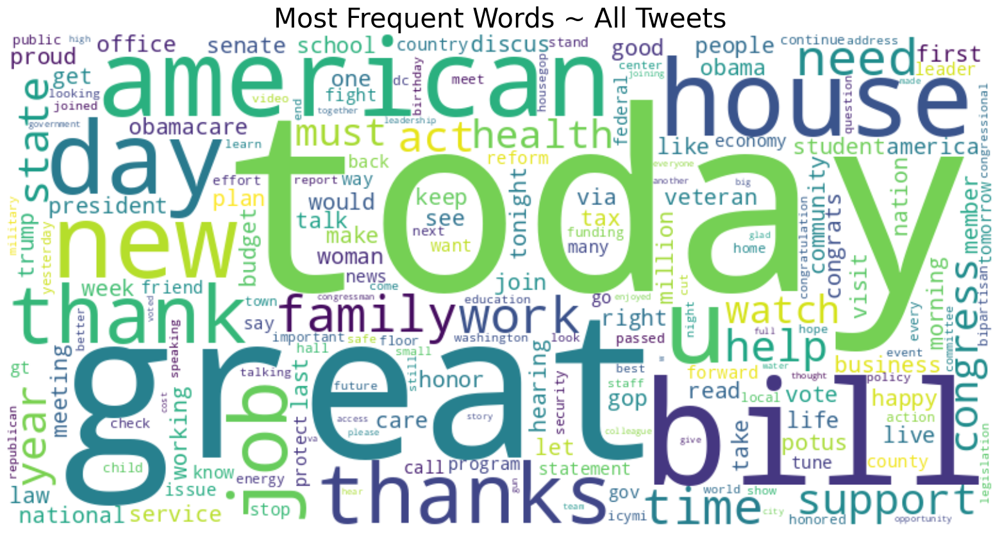

In [51]:
# Visualize words in word cloud
wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(frequency_words)

title = "Most Frequent Words ~ All Tweets"
plt.figure(figsize=(20, 10))
plt.title(title, color='black', fontsize = 30)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')

# Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

Common topics and themes accross all tweets

1. **Legislation and Congress-Related Keywords:**
    * bill, act, congress, house, senate, vote, hearing
   - These terms are directly related to legislative processes and activities in Congress.

2. **Political Statements and Discussions:**
   - great, american, u (possibly referring to "United States"), president, people, right
   - These words are commonly used in political discussions, expressing opinions, and discussing government matters.

3. **Public Services and Support:**
   - support, help, care, community, service, veteran
   - These words may relate to discussions about public services, community support, and veterans' issues.

4. **Social Issues and Equality:**
   - woman, student, proud, equality
   - These terms could indicate discussions about women's rights, education, and social equality.

5. **Healthcare and Policy:**
   - health, obamacare
   - These words could be related to discussions about healthcare policies and the Affordable Care Act (Obamacare).

6. **Job and Economy:**
   - job, work, year, economy
   - These terms may relate to discussions about employment, economic conditions, and job-related policies.

7. **Thankfulness and Positivity:**
   - thanks, thank, happy, great
   - While these words are not directly related to legislative topics, they may appear in positive discussions or expressions of gratitude from constituents.

8. **Engagement and Participation:**
   - join, watch, live, read
   - These words could refer to calls for engagement, participation in events, and staying informed.

9. **Familial and Community References:**
   - family, time, week, morning, day
   - These terms could be used to discuss personal experiences and community events.

10. **State and Local References:**
    - state, office
    - These words could refer to state-level matters and interactions with public offices.

In [52]:
# Get the date and tweet text from database to frequency of words by year
twt_text_year = pd.read_sql_query('SELECT text, created_at FROM Tweets', conn)
twt_text_year['created_at'] = pd.to_datetime(twt_text_year['created_at'])
group_tweets = twt_text_year.groupby(twt_text_year['created_at'].dt.year)

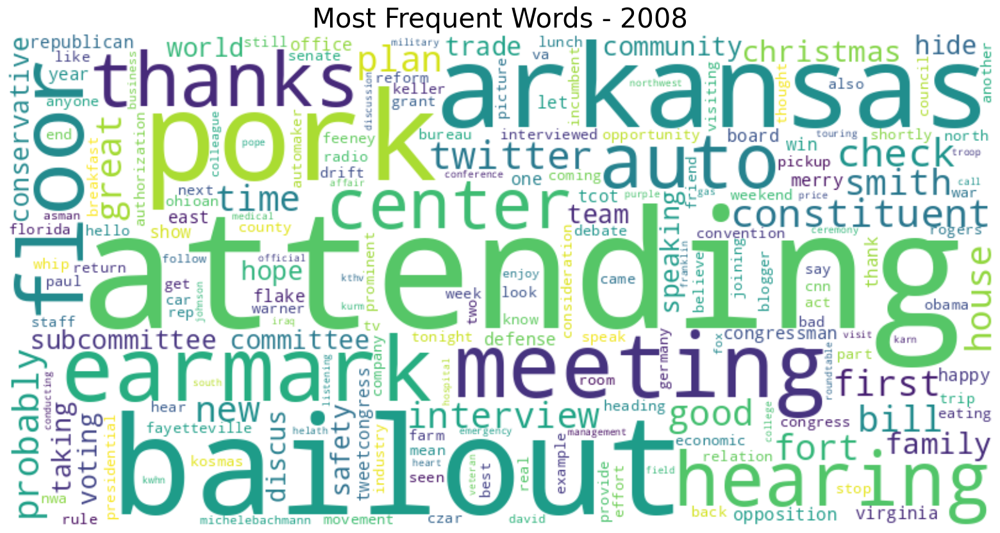

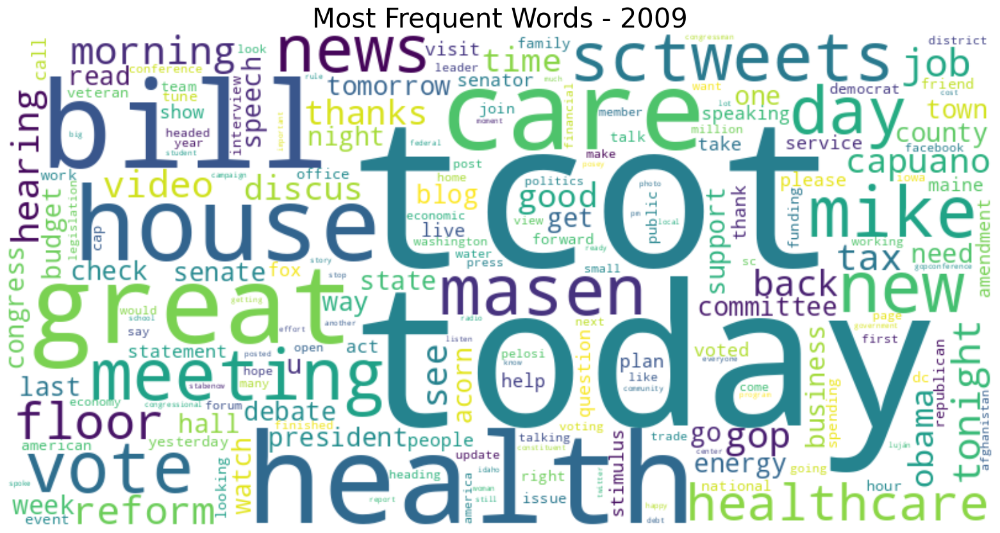

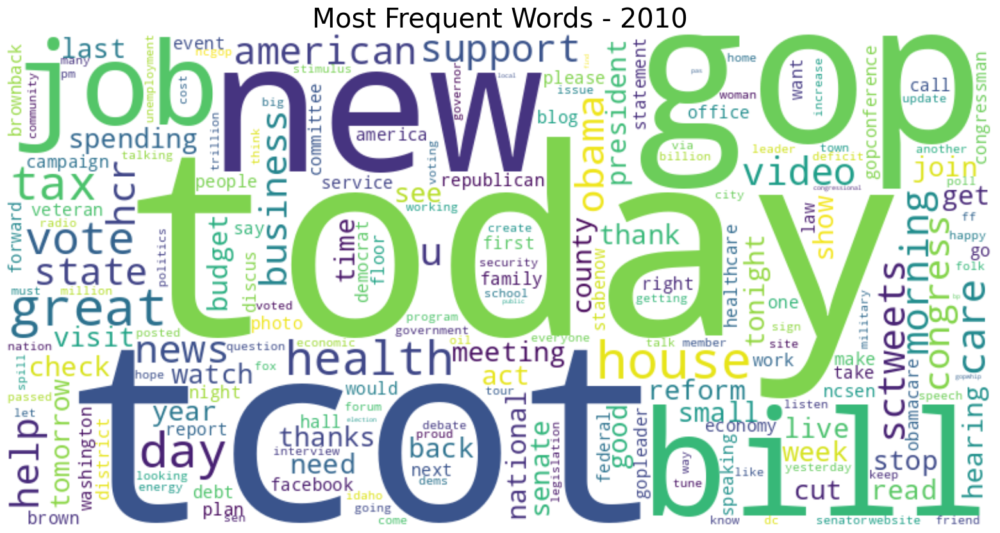

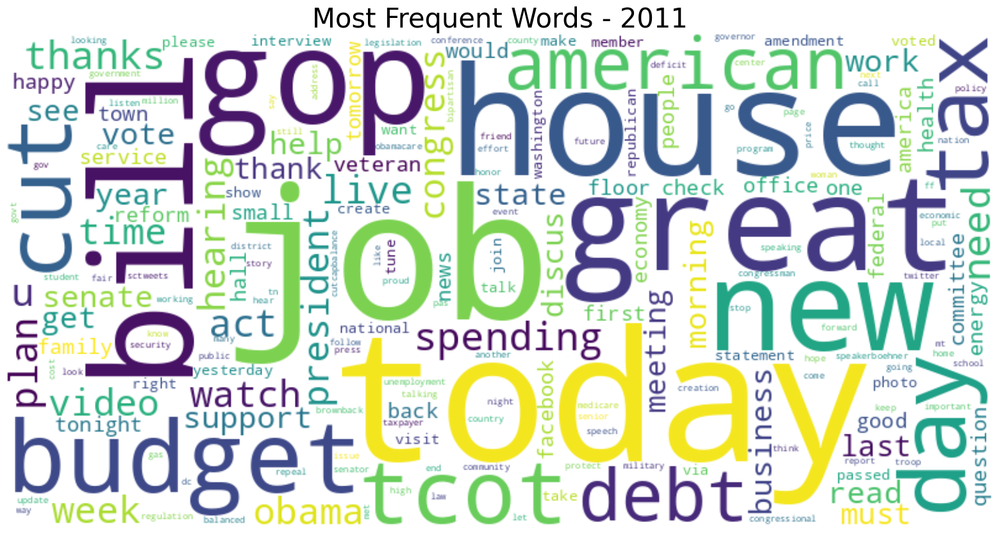

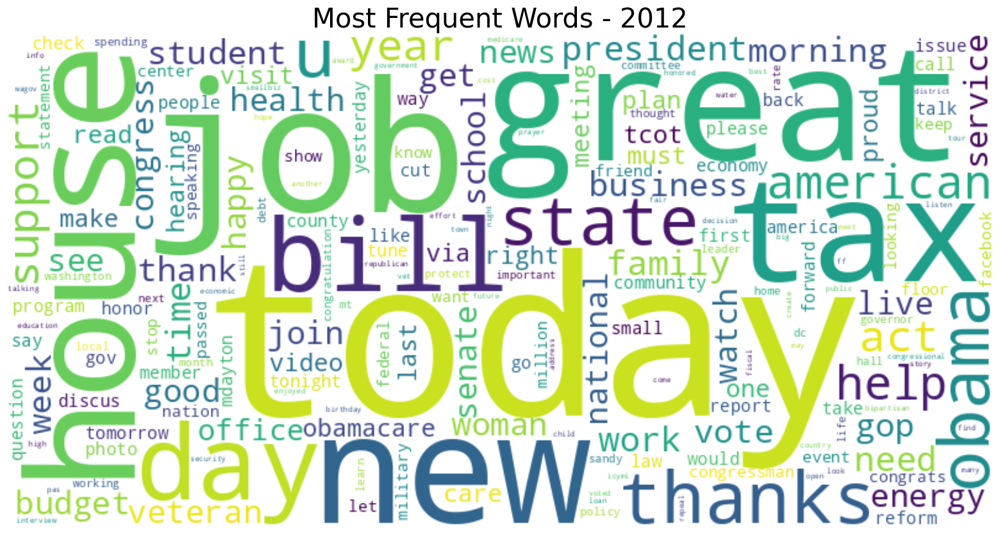

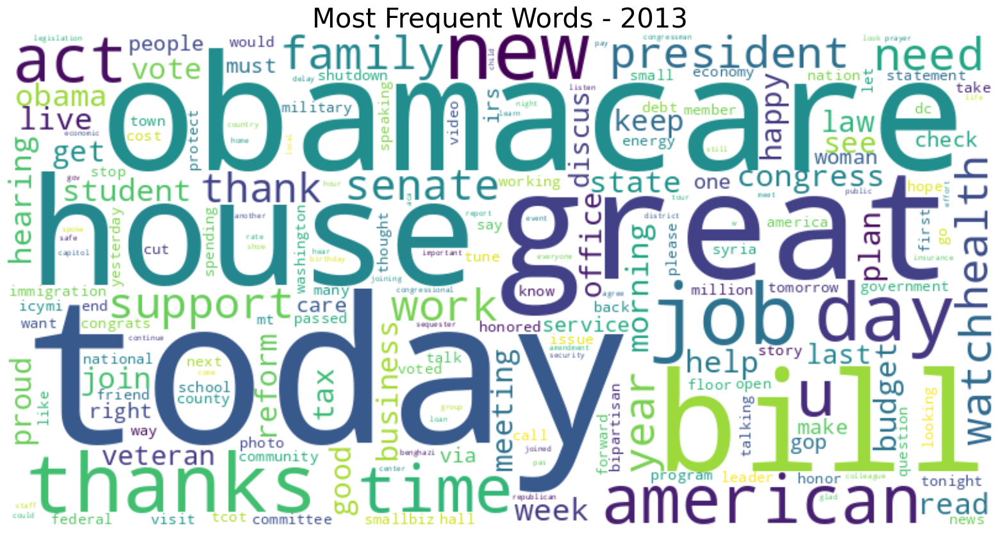

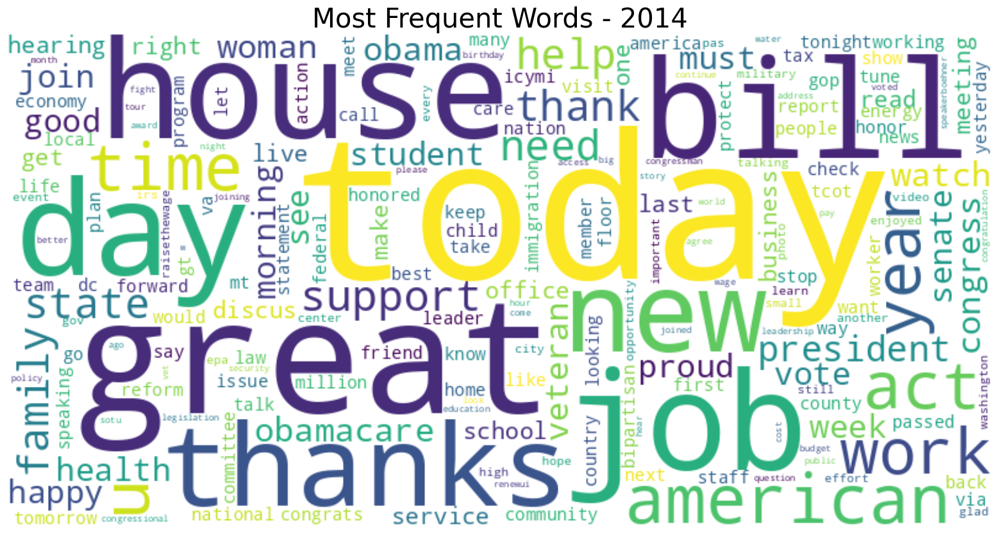

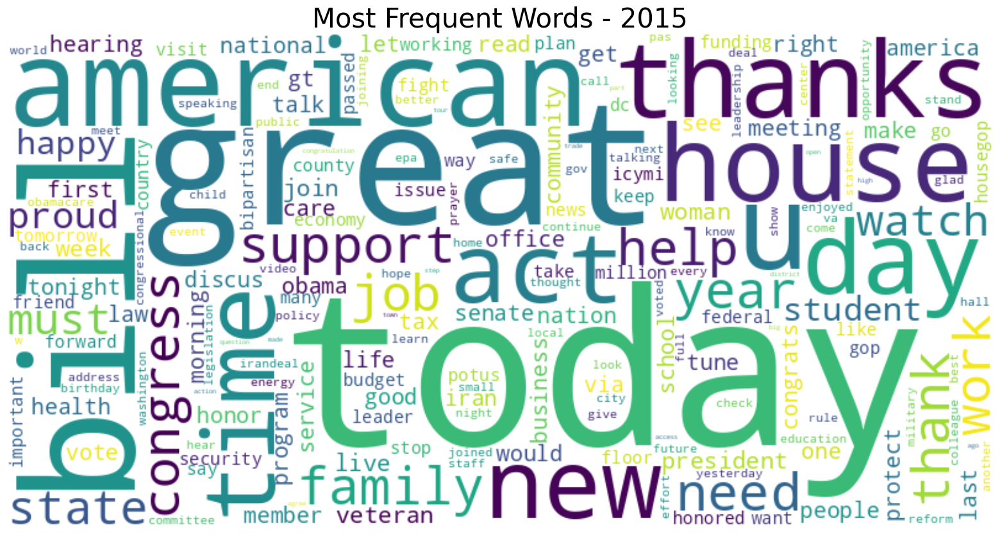

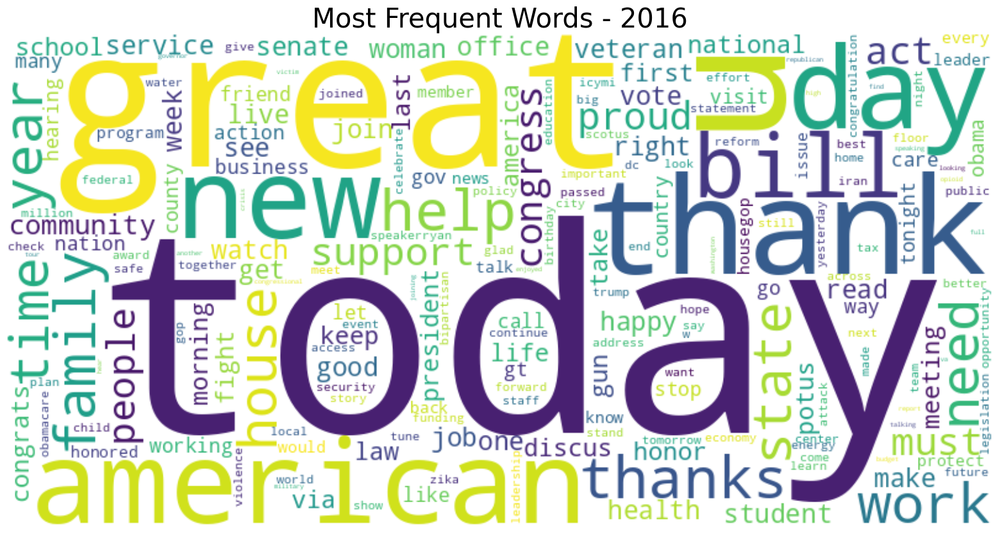

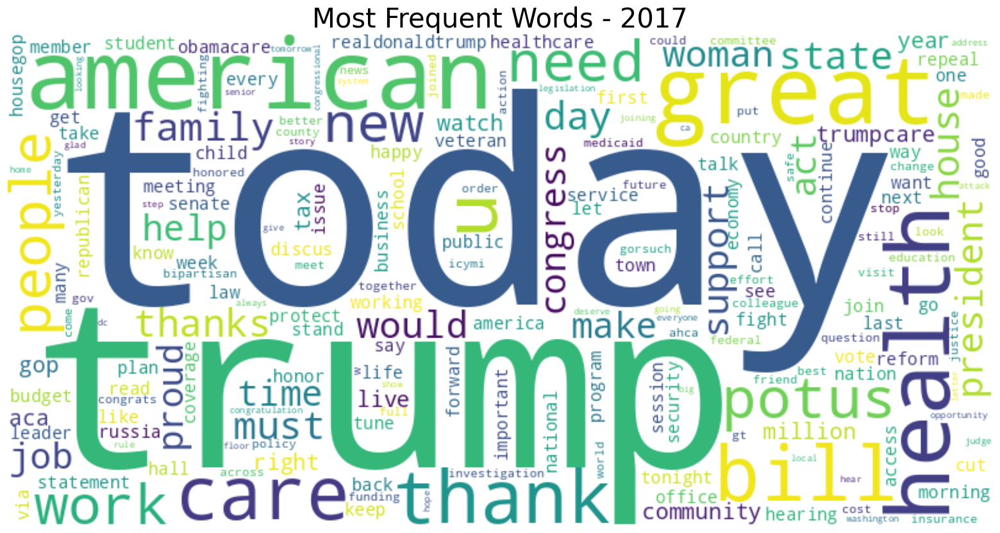

In [55]:
for year, group in group_tweets:
    freq_dist = freq_texts(group)
    
    # Create a word cloud for the year
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(freq_dist)

    plt.figure(figsize=(20, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f"Most Frequent Words - {year}", color='black', fontsize = 30)
    plt.axis('off')
    
    # Save the plot as a PNG file
    plt.savefig(f'graphs/Most Frequent Words - {year}.png')
    plt.show()

### Which members of Congress are the most active on Twitter and engage with legislative topics?

#### Hypothesis: Influential members of Congress, committee chairs, and leaders are expected to be more active on Twitter and have higher engagement with tweets related to legislation.

In [56]:
# Retrieve tweets id with key words related to legislative topics and congress
query = """
SELECT screen_name, COUNT(*) AS num_twts
FROM Users
JOIN Tweets ON Users.user_id = Tweets.user_id
WHERE text LIKE '%legislation%'
    OR text LIKE '%bill%'
    OR text LIKE '%law%'
    OR text LIKE '%act%'
    OR text LIKE '%congress%'
    OR text LIKE '%senate%'
    OR text LIKE '%house%'
    OR text LIKE '%representative%'
    OR text LIKE '%senator%'
    OR text LIKE '%policy%'
    OR text LIKE '%government%'
    OR text LIKE '%politics%'
    OR text LIKE '%committee%'
    OR text LIKE '%vote%'
    OR text LIKE '%session%'
    OR text LIKE '%hearing%'
    OR text LIKE '%debate%'
    OR text LIKE '%amendment%'
    OR text LIKE '%caucus%'
    OR text LIKE '%lobby%'
    OR text LIKE '%judiciary%'
    OR text LIKE '%oversight%'
    OR text LIKE '%bipartisanship%'
    OR text LIKE '%partisan%'
    OR text LIKE '%chamber%'
GROUP BY Tweets.user_id
ORDER BY num_twts DESC
"""

tweets_filtered = pd.read_sql_query(query, conn)

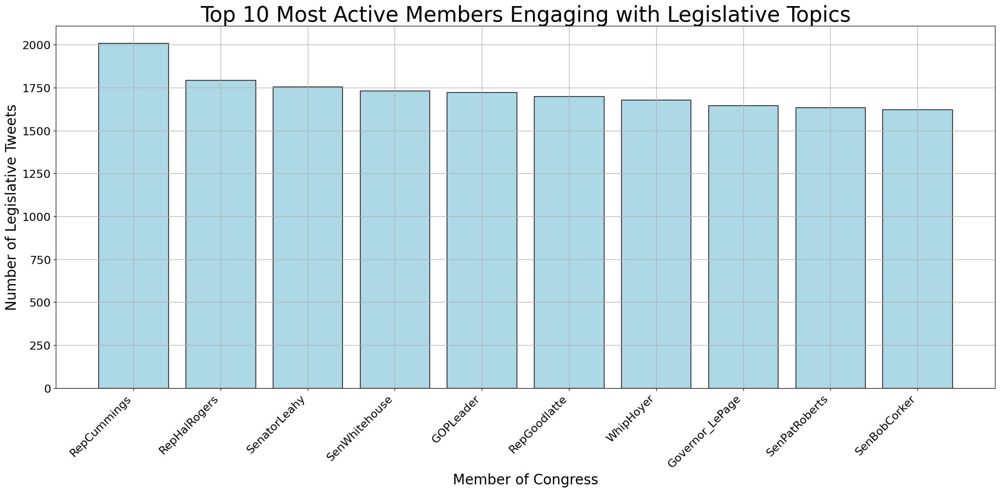

In [69]:
# Plot bar chart for the most active members engaging with legislative topics
title = "Top 10 Most Active Members Engaging with Legislative Topics"
plt.figure(figsize=(20, 10))
plt.bar(tweets_filtered['screen_name'].head(10), tweets_filtered['num_twts'].nlargest(10), color='lightblue', edgecolor='black')
plt.xlabel('Member of Congress', fontsize=20)
plt.ylabel('Number of Legislative Tweets', fontsize=20)
plt.title(title, color='black', fontsize=30)
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.tight_layout()

# Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

### Are there any significant connections or relationships between members based on their interactions on Twitter?
#### Hypothesis: Social network analysis might reveal clusters of members who frequently interact or retweet each other, indicating potential alliances or affiliations.

In [72]:
import networkx as nx

# Retrieve all tweets that have RT @ in it
query = """
    SELECT screen_name, T.tweet_id, T.user_id, T.text
    FROM Users
    JOIN Tweets T ON Users.user_id = t.user_id
    WHERE T.text LIKE '%RT @%'
"""
rt_df = pd.read_sql_query(query, conn)

# Create a directed graph to represent retweet relationships
G = nx.DiGraph()

# Add members of congress to the graph
G.add_nodes_from(rt_df['screen_name'].unique())

for _, row in rt_df.iterrows():
    source_user = row['screen_name']
    tweet_text = row['text']

    try:
        if '@' in tweet_text:
            # Split the tweet text by '@' and get the second part
            after_at = tweet_text.split('@')[1]
        
            # Split the part after '@' by space or colon and get the first element
            retweeted_user = after_at.split()[0].split(':')[0]
            if retweeted_user in G.nodes:
                G.add_edge(source_user, retweeted_user)
    except IndexError:
        print(tweet_text)

And looking forward to it! RT @@ENR_GOP @lisamurkowski to speak on energy trade @BrookingsFP January 7th. http://t.co/eXO5MRvqN0


In [74]:
degree_centrality = nx.degree_centrality(G)
# Sort members based on their degree centrality (number of retweets)
sorted_members = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)

# Extract the top N most influential members
top_n = 10
top_members = sorted_members[:top_n]

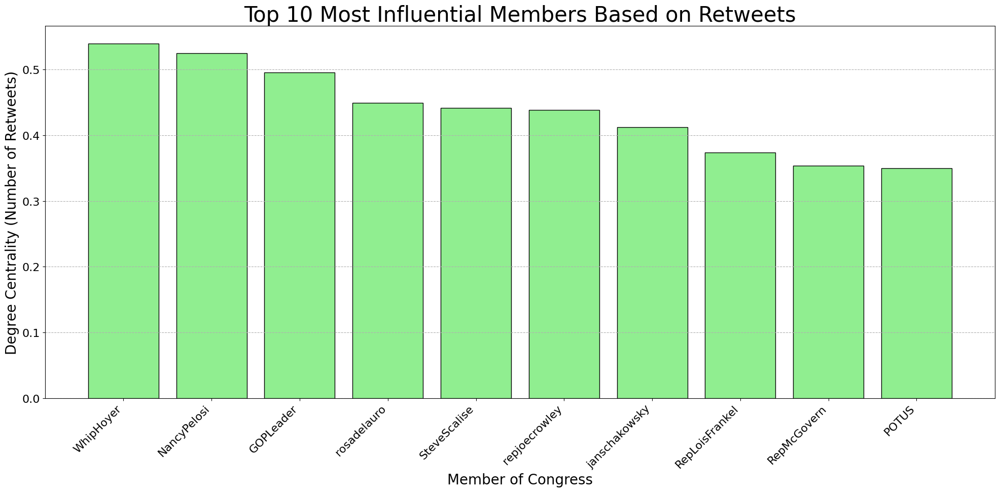

In [75]:
# Create a DataFrame for visualization
top_members = pd.DataFrame(top_members, columns=['Member of Congress', 'Degree Centrality'])

# Plot bar chart for the top 10 members with the highest degree centrality (most retweets)
title = f'Top {top_n} Most Influential Members Based on Retweets'

plt.bar(top_members['Member of Congress'], top_members['Degree Centrality'], color='lightgreen', edgecolor='black')
plt.xlabel('Member of Congress')
plt.ylabel('Degree Centrality (Number of Retweets)')
plt.title(title)
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--')
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

Degree centrality measures how well-connected a node is to other nodes in a network. In the context of a social network or interaction graph, a higher degree centrality indicates that a node (in this case, a Member of Congress) is more connected or interacts more frequently with other nodes. 	

##### Member of Congress
1. WhipHoyer - **Degree Centrality**: 0.540
2. NancyPelosi - **Degree Centrality**:	0.525
3. GOPLeader - **Degree Centrality**: 0.495
4. rosadelauro - **Degree Centrality**:	0.449
5. SteveScalise - **Degree Centrality**: 0.442
6. repjoecrowley - **Degree Centrality**: 0.438
7. janschakowsky - **Degree Centrality**: 0.413
8. RepLoisFrankel - **Degree Centrality**: 0.374
9. RepMcGovern - **Degree Centrality**: 0.354
10. POTUS - **Degree Centrality**: 0.350

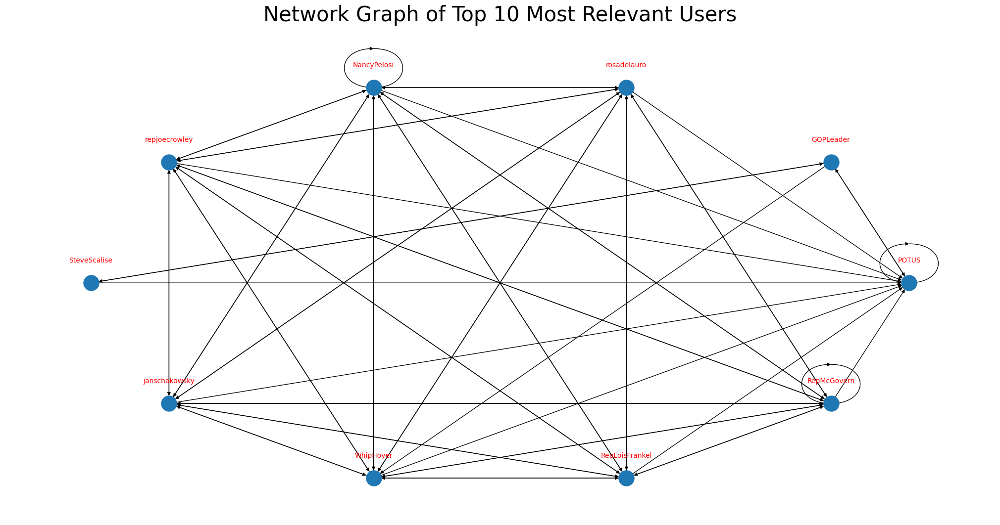

In [77]:
top_members = [member for member, centrality in sorted_members[:top_n]]

# Create a subgraph with the top most relevant users
subgraph = G.subgraph(top_members)

# Position nodes using spring layout
pos = nx.shell_layout(subgraph)

# Draw the subgraph with labels and fixed node size
nx.draw(subgraph, pos, with_labels=False, node_size=500, font_size=10)

# Draw node labels separately with adjusted positions and colors
for node, (x, y) in pos.items():
    plt.text(x, y + 0.1, node, fontsize=10, ha='center', color='red')

title = f'Network Graph of Top {top_n} Most Relevant Users'
plt.title(title)

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

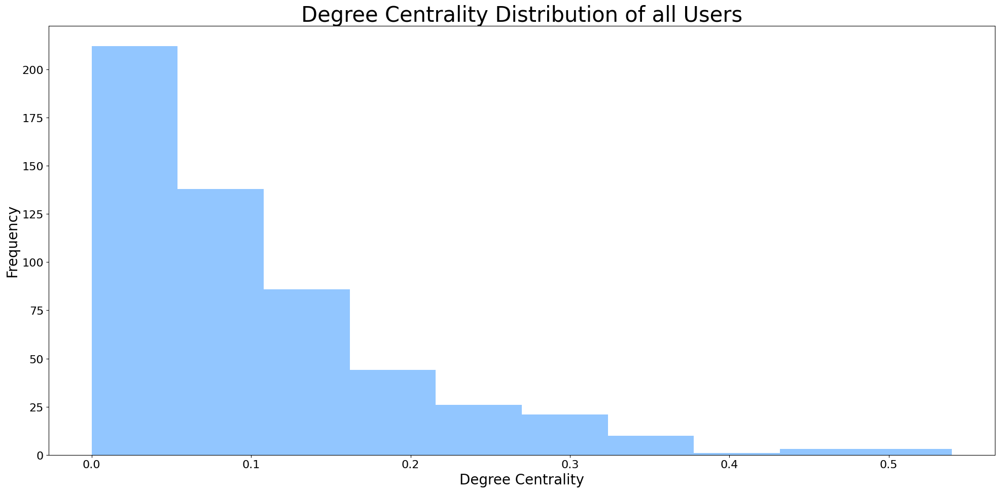

In [79]:
# Histogram of Degree Centrality Distribution among all users
all_members = pd.DataFrame(sorted_members, columns=['Member of Congress', 'Degree Centrality'])

tille = "Degree Centrality Distribution of all Users"
plt.hist(all_members['Degree Centrality'])
plt.xlabel('Degree Centrality')
plt.ylabel('Frequency')
plt.title(tille)
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

# Futher Analysis

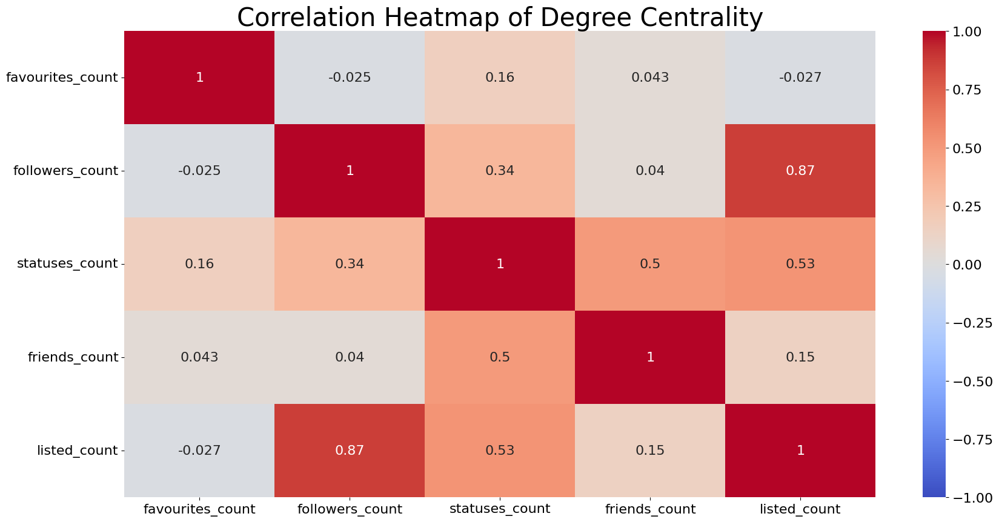

In [81]:
import seaborn as sns

# Retrieve columns from Database
query = """
    SELECT
        screen_name,
        favourites_count,
        followers_count,
        statuses_count,
        friends_count,
        listed_count
    FROM
        Users
"""

users_df = pd.read_sql_query(query, conn)

# Calculate the correlation matrix
correlation_matrix = users_df[['favourites_count','followers_count', 'statuses_count', 'friends_count', 'listed_count']].corr()

# Create a heatmap using Seaborn
title = "Correlation Heatmap of Degree Centrality"

sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title(title)

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()


1. **Followers and Listed Count**: There is a strong positive correlation (0.87) between `followers_count` and `listed_count`, which suggests that users with more followers tend to be listed more often.

2. **Statuses Count and Listed Count**: There's a moderate positive correlation (0.53) between `statuses_count` and `listed_count`, indicating that users who have posted more tweets tend to be listed more.

3. **Statuses Count and Followers Count**: There's a moderate positive correlation (0.34) between `statuses_count` and `followers_count`, which means users who have posted more tweets tend to have more followers.

4. **Statuses Count and Friends Count**: There's a moderate positive correlation (0.50) between `statuses_count` and `friends_count`, suggesting that users who have posted more tweets tend to follow more accounts.

5. **Followers Count and Friends Count**: There's a positive but weak correlation (0.04) between `followers_count` and `friends_count`, indicating that users with more followers tend to follow slightly more accounts.

6. **Favourites Count and Statuses Count**: There's a positive but weak correlation (0.16) between `favourites_count` and `statuses_count`, suggesting that users who have liked more tweets tend to have posted more tweets.


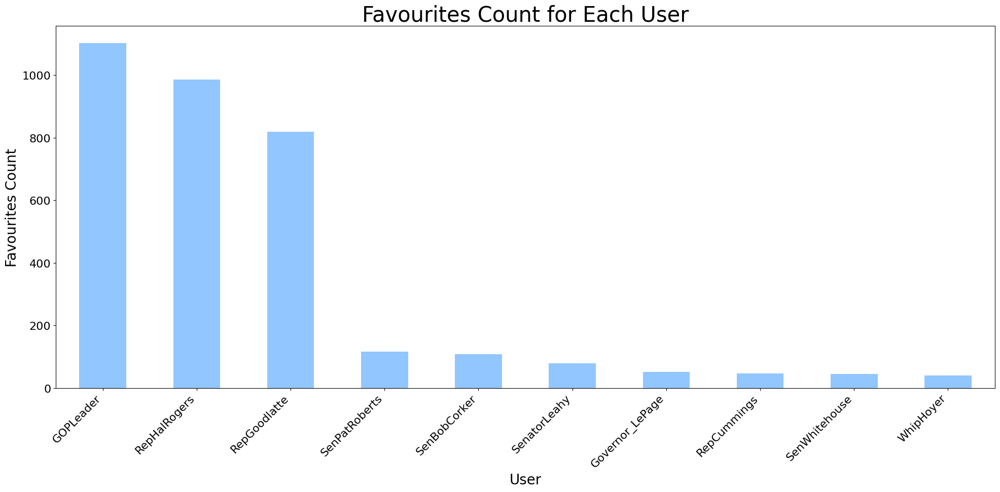

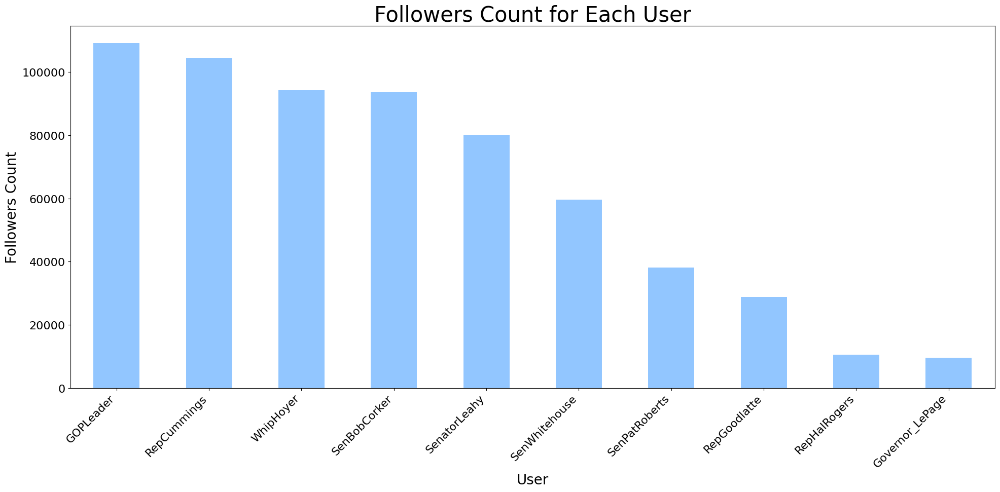

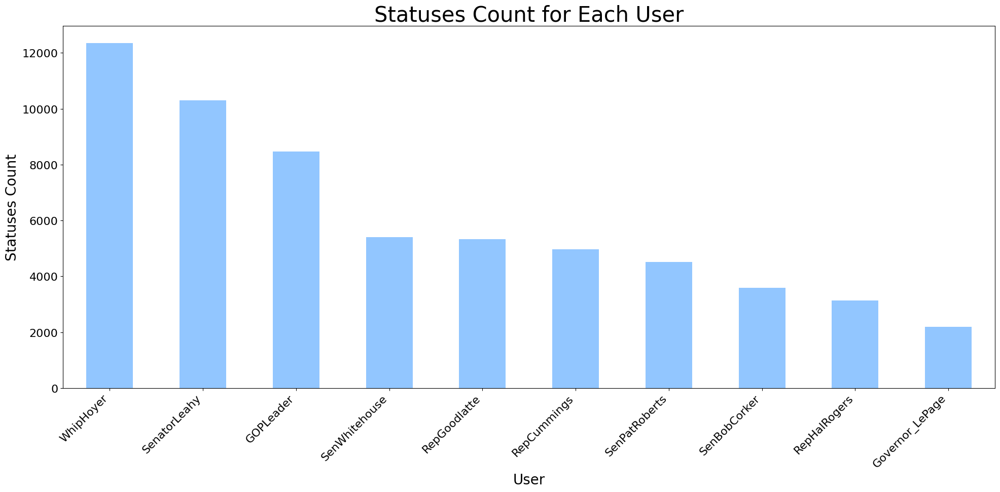

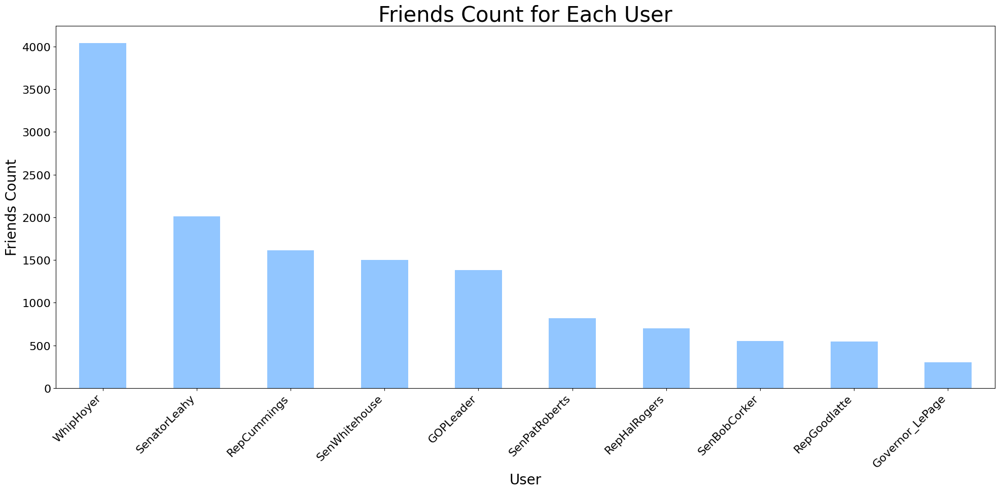

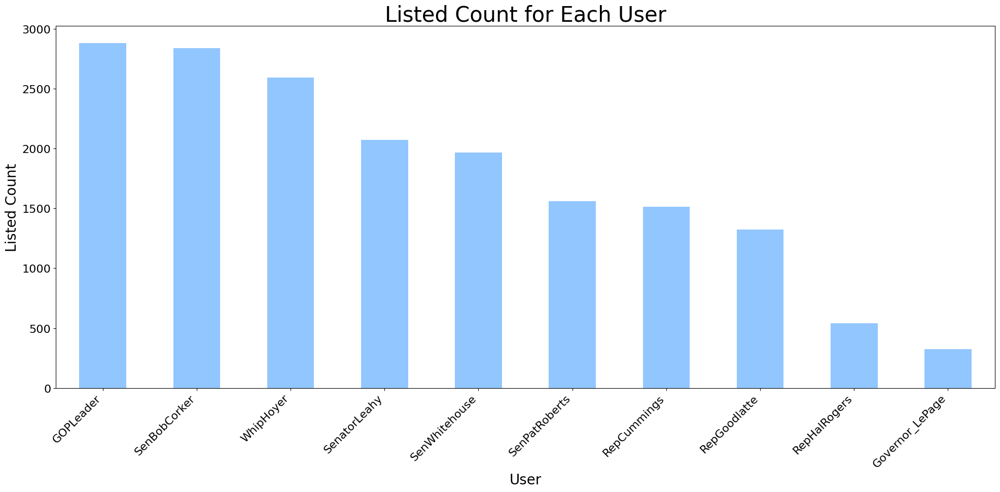

In [96]:
# Top 10 users that engage with legislative topics
legislative_users = tweets_filtered.head(10)
legislative_users = pd.merge(legislative_users, users_df, on='screen_name', how='left')

legislative_users.set_index('screen_name', inplace=True)

# Plot each attribute in a separate graph
attributes = ['favourites_count', 'followers_count', 'statuses_count', 'friends_count', 'listed_count']

for attribute in attributes:
    title = f'{attribute.replace("_", " ").title()} for Each User'
    ax = legislative_users[attribute].sort_values(ascending=False).plot(kind='bar')
    ax.set_xlabel('User')
    ax.set_ylabel(attribute.replace('_', ' ').title())
    ax.set_title(title)
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')  # Set tick labels
    plt.tight_layout()
    #Save the plot as a PNG file
    plt.savefig(f'graphs/{title}.png')
    plt.show()

#### Perform Sentiment Analysis of tweets using the VADER model

  0%|          | 0/1243370 [00:00<?, ?it/s]

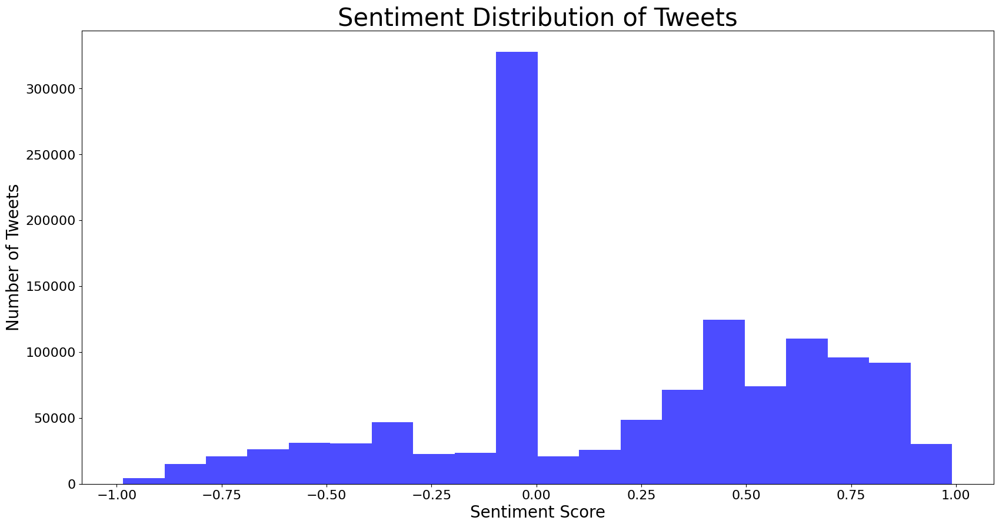

In [97]:
from nltk.sentiment import SentimentIntensityAnalyzer
from tqdm.notebook import tqdm

sia = SentimentIntensityAnalyzer()
tweet_data = pd.read_sql_query('SELECT tweet_id, text FROM tweets', conn)

vader_res = {}
for i in tqdm(range(len(tweet_data))):
    text = tweet_data['text'][i]
    id = tweet_data['tweet_id'][i]
    vader_res[id] = sia.polarity_scores(text)

# Conver vader_res to a DF
tweets_scores = pd.DataFrame(vader_res).T
tweets_scores = tweets_scores.reset_index().rename(columns={'index': 'tweet_id'})

# Plot the sentiment distribution as a histogram
title = "Sentiment Distribution of Tweets"
plt.hist(tweets_scores['compound'], bins=20, color='blue', alpha=0.7)

# Add labels and title
plt.xlabel('Sentiment Score')
plt.ylabel('Number of Tweets')
plt.title(title)

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()


In [98]:
# Check tweets with compound score < -0.05

filtered_scores = tweets_scores[tweets_scores['compound'] < -0.05]
filtered_tweet_ids = filtered_scores['tweet_id']
neg_tweets = pd.read_sql_query(f"SELECT text FROM Tweets WHERE tweet_id IN ({','.join(map(str,filtered_tweet_ids))})" , conn)
neg_tweets.head(10)

,text
0,"Meeting with Emergency Management officials from Johnson, Pope and Franklin counties"
1,Attending a Foreign Relations Committee Hearing on US-Russia Relations in the Aftermath of the Georgia Crisis
2,"I'd tell you to hide your wallet, but it's probably too late. This will likely be a very bad week. Will keep you updated as the slog goes on"
3,Will be heading the the conservative bloggers briefing today to discuss porkparade.com and the 'Bailout Congress' #pork
4,I'm speaking on the floor shortly to in opposition to an effort to hide earmarks in the defense authorization bill.
5,I'm speaking on the floor shortly to in opposition to an effort to hide earmarks in the defense authorization bill #pork
6,I'm speaking on House floor soon opposing bailout. #pork
7,[staff] Congressman Flake's speech on the floor urging opposition to the bailout: http://tinyurl.com/4b4g9t
8,"Banks, the auto industry, now the ethanol industry wants a bailout. http://www.reason.com/blog/show/129627.html where does it end?"
9,"Settling in to the ""War Room"" having just finished initial TV interviews. Indiana/Kentucky results starting to drift in. Next hour exciting!"


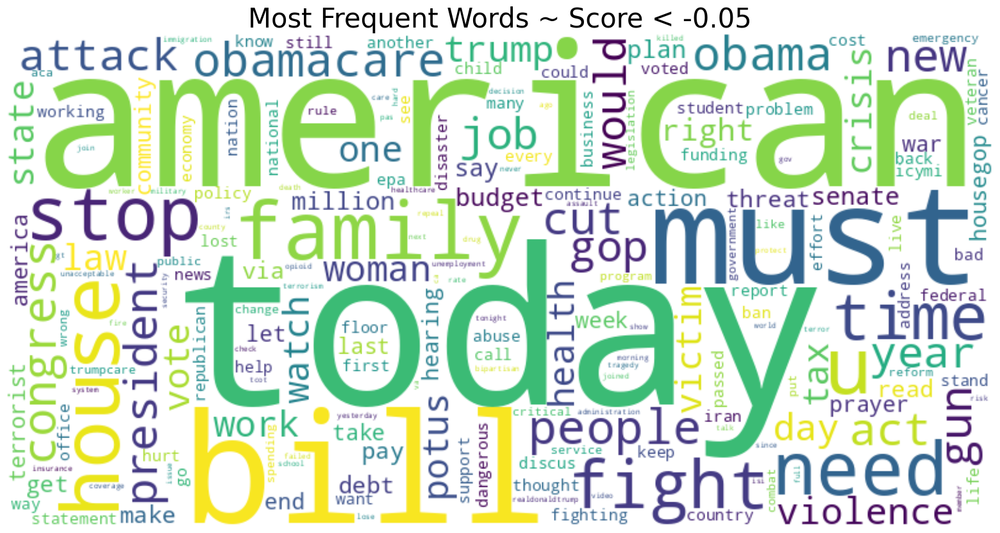

In [106]:
# Tokenize and get distribution of words
neg_tweets_dist = freq_texts(neg_tweets)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(neg_tweets_dist)
title = "Most Frequent Words ~ Score < -0.05"

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title(title)

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

### Most Frequent Words ~ Score < -0.05
1. today - 16872
2. american - 13603
3. bill - 11843
4. must - 10527
5. family - 10520
6. house - 10430
7. u - 10062
8. stop - 8828
9. need - 8638
10. fight - 8606
11. time - 8353
12. people - 8236
13. obama - 7821
14. obamacare - 7797
15. congress - 7783
16. president - 7495
17. gun - 7457
18. act - 7400
19. cut - 7382
20. new - 7268

In [102]:
# Check tweets with positive sentiment score > 0.05
filtered_scores = tweets_scores[tweets_scores['compound'] > 0.05]
filtered_tweet_ids = filtered_scores['tweet_id']

pos_tweets = pd.read_sql_query(f"SELECT text FROM tweets WHERE tweet_id IN ({','.join(map(str,filtered_tweet_ids))})", conn)
pos_tweets.head()

,text
0,conducting a veterans affairs economic opportunity subcommittee field hearing at the northwest arkansas community college
1,"Attending a Transportation and Infrastructure Committee Hearing on H.R. 6707, the ""Taking Responsible Action for Community Safety Act"""
2,Voting on Adoption of the Rule to provide consideration for H.R. 6842 - National Capital Security and Safety Act
3,I've launched porkparade.com to spread the movement to stop earmarks. Hope you'll check it out and contribute to the movement using #pork.
4,"headed to floor right now to speak against defense approps bill...1,200 earmarks in the bill that we haven't seen..#pork"


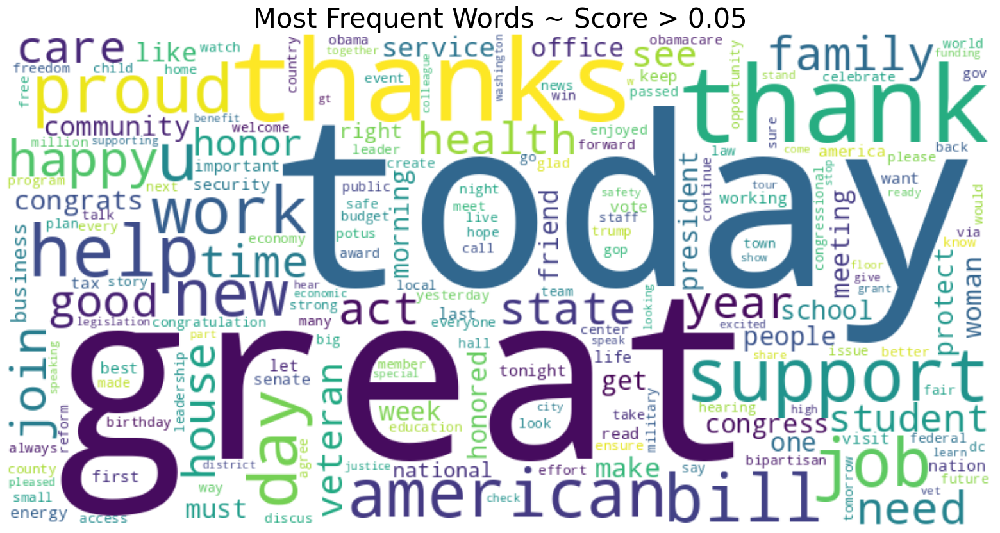

In [107]:
# Tokenize and get distribution of words
pos_tweets_dist = freq_texts(pos_tweets)

wordcloud = WordCloud(width=800, height=400, background_color='white').generate_from_frequencies(pos_tweets_dist)
title = "Most Frequent Words ~ Score > 0.05"

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title(title)

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

### Most Frequent Words ~ Score > 0.05

1. today - 71594
2. great - 70670
3. thanks - 43175
4. thank - 40024
5. support - 33750
6. help - 32444
7. u - 29133
8. bill - 28454
9. proud - 27960
10. day - 27837
11. job - 27761
12. american - 27638
13. work - 26884
14. new - 26109
15. happy - 26017
16. join - 23978
17. family - 23844
18. good - 22560
19. house - 22289
20. care - 22123

#### Themes for text

In [110]:
tweet_data

,tweet_id,text
0,877418565,On a conference call about a weekend trip to Iraq to visit Arkansas troops
1,879618172,Being interviewed by KTHV
2,879695803,Being interviewed by KARN on his Arkansas World Trade Center trip
3,880393665,"On KWHN in Fort Smith, that's 1320 AM"
4,880474266,Attending a Military of the Purple Heart Ceremony at the VA Medical Center in Fayetteville
...,...,...
1243365,872139777444917249,Dismantling #DoddFrank returns us to the days when families lost their homes and their life savings during the financial crisis.
1243366,872139786378780677,"In the shadows of the #ComeyHearing, @HouseGOP plans to let Wall Street banks take the same risks that led to the 2008 financial crisis.🤦‍♂️ https://t.co/GsVMk9Q9Xp"
1243367,872139844717338624,@BetsyDeVosED How does a budget that cuts investments in American students &amp; schools make us more globally competitive? #Questions4Betsy #TrumpBudget
1243368,872140013416443906,Thank you @POTUS @NikkiHaley for strong stance against #VZ regime. #Maduro + his thugs must be held accountable\nhttps://t.co/ArDxoqPmYh


In [111]:
# Returns lemmatize tokens
def token_text(df_text):
    all_text = ' '.join(df_text['text'])
    
    # Tokenize text
    tokens = word_tokenize(all_text)
    tokens = [token.lower() for token in tokens]
    tokens = [token for token in tokens if token.isalpha()]
    
    # Remove stop words and chosen words
    stop_words = set(stopwords.words('english'))
    chosen_words = set(["http", "https", "rt", "amp"])
    
    # Initialize WordNetLemmatizer
    lemmatizer = WordNetLemmatizer()
    
    # Filter out words
    tokens = [token for token in tokens if token not in stop_words and token not in chosen_words]
    
    # Lemmatize tokens
    tokens = [lemmatizer.lemmatize(token) for token in tokens]

    return tokens

In [114]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import NMF

tokens = token_text(tweet_data)

# Create bag of words
bow = CountVectorizer()
X = bow.fit_transform(tokens)

In [116]:
import numpy as np

index2word = np.array(bow.get_feature_names_out())
nmf = NMF(n_components=7, solver="mu")
W = nmf.fit_transform(X)
H = nmf.components_

topic_clusters = []

for i, topic in enumerate(H):
    terms = [index2word[idx] for idx in topic.argsort()[-15:]]
    topic_clusters.append({'name': f"Topic cluster {i + 1}", 'terms': terms})
    print(f"Topic cluster {i + 1}: {terms}")

Topic cluster 1: ['people', 'congress', 'year', 'time', 'act', 'work', 'thank', 'help', 'need', 'state', 'job', 'support', 'thanks', 'family', 'today']
Topic cluster 2: ['woman', 'student', 'health', 'people', 'president', 'must', 'year', 'time', 'thank', 'help', 'support', 'family', 'state', 'thanks', 'great']
Topic cluster 3: ['student', 'week', 'congress', 'watch', 'health', 'job', 'year', 'support', 'act', 'work', 'family', 'thank', 'need', 'thanks', 'bill']
Topic cluster 4: ['care', 'make', 'woman', 'act', 'people', 'student', 'congress', 'health', 'watch', 'support', 'work', 'family', 'thanks', 'need', 'american']
Topic cluster 5: ['must', 'watch', 'health', 'help', 'job', 'work', 'support', 'state', 'act', 'year', 'family', 'need', 'thank', 'thanks', 'house']
Topic cluster 6: ['care', 'community', 'live', 'make', 'see', 'president', 'week', 'health', 'woman', 'year', 'act', 'thank', 'work', 'need', 'new']
Topic cluster 7: ['care', 'right', 'office', 'live', 'need', 'vote', 'stud

1. **Topic cluster 1:** This topic seems to be centered around general aspects of Congress and legislative activities, such as bills, support, work, and thanks.

2. **Topic cluster 2:** This topic appears to be related to social and political issues, including health, women's rights, support, and the presidency.

3. **Topic cluster 3:** This topic could be related to civic engagement, voting, and being proud of representation, possibly focusing on women's rights.

4. **Topic cluster 4:** This topic could involve health care, veterans, and legislative actions to support them.

5. **Topic cluster 5:** This topic might pertain to positive actions, such as supporting rights, people, and community, and discussing political actions and their impact.

6. **Topic cluster 6:** This topic might be related to education, students, and the importance of joining and helping within a community.

7. **Topic cluster 7:** This topic could involve the role of the community and individuals in making positive changes and supporting actions led by a president.

In [117]:
merged_df = pd.merge(tweets_scores,tweet_data, on="tweet_id", how='inner')

# Create a new column to store the associated topic cluster for each tweet
merged_df['associated_topic'] = None

# Iterate through each tweet
for index, tweet in merged_df.iterrows():
    tweet_text = tweet['text']
    tweet_compound = tweet['compound']
    
    # Iterate through each topic cluster
    for topic_cluster in topic_clusters:
        terms = topic_cluster['terms']
        
        # Check if any term in the topic cluster matches the tweet's text
        if any(term in tweet_text for term in terms):
            # Associate the tweet with the current topic cluster
            merged_df.at[index, 'associated_topic'] = topic_cluster['name']
            break  # Once a match is found, no need to check other topic clusters


# Analyze sentiment within each topic cluster
for topic_cluster in topic_clusters:
    cluster_name = topic_cluster['name']
    cluster_tweets = merged_df[merged_df['associated_topic'] == cluster_name]
    
    # Calculate aggregate sentiment for the topic cluster
    avg_sentiment = cluster_tweets['compound'].mean()
    
    print(f"Topic Cluster: {cluster_name}")
    print(f"Average Sentiment: {avg_sentiment:.2f}")
    print("-----")


Topic Cluster: Topic cluster 1
Average Sentiment: 0.28
-----
Topic Cluster: Topic cluster 2
Average Sentiment: 0.33
-----
Topic Cluster: Topic cluster 3
Average Sentiment: 0.14
-----
Topic Cluster: Topic cluster 4
Average Sentiment: 0.15
-----
Topic Cluster: Topic cluster 5
Average Sentiment: 0.17
-----
Topic Cluster: Topic cluster 6
Average Sentiment: 0.21
-----
Topic Cluster: Topic cluster 7
Average Sentiment: 0.24
-----


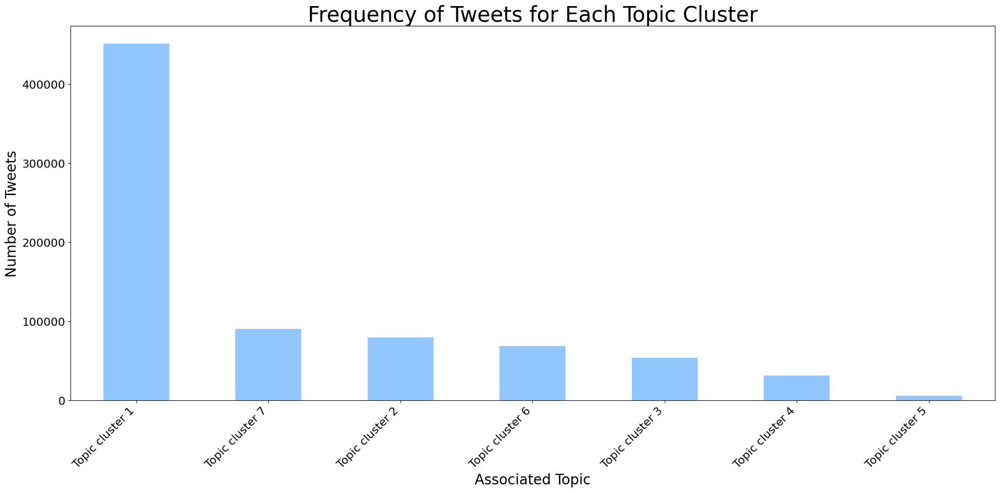

In [134]:
# Count the frequency of each associated topic
topic_counts = merged_df['associated_topic'].value_counts()

# Create a bar plot
title = 'Frequency of Tweets for Each Topic Cluster'

topic_counts.plot(kind='bar')
plt.xlabel('Associated Topic')
plt.ylabel('Number of Tweets')
plt.title(title)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

#Save the plot as a PNG file
plt.savefig(f'graphs/{title}.png')
plt.show()

In [135]:
# Close Database connection
conn.close()